In [27]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import animation
from IPython.display import HTML, Image, display
import time
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split

import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from tqdm import tqdm

In [4]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)

cuda


## Dataset - N halfmoons

In [5]:
def make_halfmoons(n_samples_per_class=1000, n_classes=6, noise=0.2, outer_radius=10.0, inner_radius=5.0):

    X = np.zeros((n_samples_per_class * n_classes, 2), dtype=np.float32)
    y = np.zeros(n_samples_per_class * n_classes, dtype=np.int64)
    for j in range(n_classes):
        ix = range(n_samples_per_class * j, n_samples_per_class * (j + 1))
        a = outer_radius
        phi = j * 2 * np.pi / n_classes
        r = inner_radius + noise * np.random.randn(n_samples_per_class)
        t = np.linspace(0, np.pi, n_samples_per_class)
        X[ix] = np.c_[a * np.sin(phi) + r * np.sin(t + phi), a * np.cos(phi) + r * np.cos(t + phi)]
        y[ix] = j
    return X, y

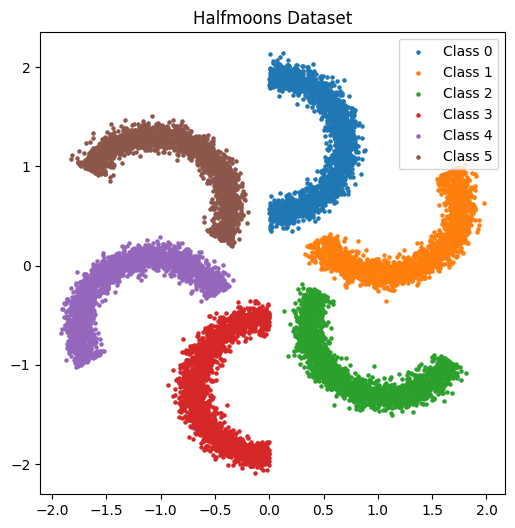

In [39]:
X, y = make_halfmoons(n_samples_per_class=2000, n_classes=6, noise=0.4, inner_radius=4.0, outer_radius=7.0)
X = StandardScaler().fit_transform(X)
plt.figure(figsize=(6,6))
for i in range(6):
    plt.scatter(X[y==i,0], X[y==i,1], s=5, label=f'Class {i}')
plt.title("Halfmoons Dataset")
plt.legend()
plt.show()

In [42]:
train_X, test_X, train_y, test_y = train_test_split(X, y, test_size=0.2, random_state=42)
trainset = torch.utils.data.TensorDataset(torch.tensor(train_X), torch.tensor(train_y))
trainloader = torch.utils.data.DataLoader(trainset, batch_size=64, shuffle=True)
testset = torch.utils.data.TensorDataset(torch.tensor(test_X), torch.tensor(test_y))
testloader = torch.utils.data.DataLoader(testset, batch_size=64, shuffle=False)

In [43]:
print(len(trainset), len(trainloader))
print(len(testset), len(testloader))

9600 150
2400 38


## Samplers

### NCSN Training & Sampler

In [44]:
# Feature Augmentation with Gaussian Fourier Projections
class GaussianFourierProjection(nn.Module):
    def __init__(self, input_dim=3, embedding_size=256, scale=10.0):
        super(GaussianFourierProjection, self).__init__()
        self.W = nn.Parameter(torch.randn(input_dim, embedding_size // 2) * scale, requires_grad=False)

    def forward(self, x):
        x_proj = x @ self.W
        return torch.cat([torch.sin(x_proj), torch.cos(x_proj)], dim=-1)
    

class score_network(nn.Module):
    def __init__(self, input_dim=2, embed_dim=128, hidden_dim=128, scale=5.0, output_dim=2):
        super(score_network, self).__init__()

        self.embed = GaussianFourierProjection(input_dim=input_dim, embedding_size=embed_dim, scale=scale)

        self.noise_embed = nn.Sequential(
            nn.Linear(1, embed_dim),
            nn.Softplus(),
            nn.Linear(embed_dim, embed_dim),
        )

        self.fc1 = nn.Linear(embed_dim, hidden_dim)
        self.fc2 = nn.Linear(hidden_dim, hidden_dim)
        self.fc3 = nn.Linear(hidden_dim, output_dim)

    def forward(self, x, sigma):
        x_embed = self.embed(x)
        t_embed = self.noise_embed(torch.log(sigma).view(-1, 1))
        x_embed = x_embed + t_embed

        out = F.softplus(self.fc1(x_embed))
        out = F.softplus(self.fc2(out))
        out = self.fc3(out)
        return out

In [10]:
class schedule_sigma:
    def __init__(self, sigma_min=0.01, sigma_max=1.0):
        self.sigma_min = sigma_min
        self.sigma_max = sigma_max

    def get_sigma(self, t):
        return self.sigma_max * (self.sigma_min / self.sigma_max) ** t

In [11]:
class NCSN_sampler:
    # Langevin Dynamics Sampler
    def __init__(self, score_model, scheduler=schedule_sigma(), device='cpu'):
        self.score_model = score_model
        self.scheduler = scheduler
        self.device = device
    
    def sample(self, batch_size, num_batches, num_steps=1000, step_lr=2e-5):
        self.score_model.eval()
        result = np.zeros((num_batches * batch_size, 2), dtype=np.float32)

        t_final = torch.ones(1, device=self.device)
        sigma_min = self.scheduler.get_sigma(t_final).item()

        with torch.no_grad():
            for i in range(num_batches):
                t_init = torch.zeros(batch_size, device=self.device)
                sigma_max = self.scheduler.get_sigma(t_init).view(-1, 1)
                x = torch.randn(batch_size, 2).to(self.device) * sigma_max

                for step in range(num_steps):
                    t = torch.full((batch_size,), step / num_steps, device=self.device)
                    sigma_curr = self.scheduler.get_sigma(t).view(-1, 1)
                    
                    score = self.score_model(x, sigma_curr) 
                    
                    alpha = step_lr * (sigma_curr / sigma_min) ** 2
                    
                    z = torch.randn_like(x)
                    
                    if step == num_steps - 1:
                        z = torch.zeros_like(x)

                    x = x + 0.5 * alpha * score + torch.sqrt(alpha) * z
                    
                result[i * batch_size:(i + 1) * batch_size] = x.detach().cpu().numpy()
        return result
    
    def sample_with_history(self, batch_size, num_steps=1000, delim=10, step_lr=2e-5):
        self.score_model.eval()
        
        t_init = torch.zeros(batch_size, device=self.device)
        sigma_max = self.scheduler.get_sigma(t_init).view(-1, 1)
        t_final = torch.ones(1, device=self.device)
        sigma_min = self.scheduler.get_sigma(t_final).item()
        x = torch.randn(batch_size, 2).to(self.device) * sigma_max
        history = [x.detach().cpu().numpy()]

        with torch.no_grad():
            for step in range(num_steps):
                t = torch.full((batch_size,), step / num_steps, device=self.device)
                sigma_curr = self.scheduler.get_sigma(t).view(-1, 1)
                
                score = self.score_model(x, sigma_curr) 
                
                alpha = step_lr * (sigma_curr / sigma_min) ** 2
                
                z = torch.randn_like(x)
                
                if step == num_steps - 1:
                    z = torch.zeros_like(x)

                x = x + 0.5 * alpha * score + torch.sqrt(alpha) * z
                if step % delim == 0:
                    history.append(x.detach().cpu().numpy())
        return np.array(history)

In [30]:
def train_NCSN(model, scheduler, optimizer, num_epochs=100):
    model.train()
    losses = []
    for epoch in range(num_epochs):
        epoch_loss = 0.0
        for batch_x, _ in trainloader:
            batch_x = batch_x.to(device)
            batch_size = batch_x.size(0)

            t = torch.rand(batch_size, device=device)

            sigma = scheduler.get_sigma(t).view(-1, 1)

            z = torch.randn_like(batch_x)
            x_noisy = batch_x + sigma * z

            score_pred = model(x_noisy, sigma)

            loss = (((score_pred * sigma + z) ** 2)).mean()
            
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()
            epoch_loss += loss.item() * batch_size
        epoch_loss /= len(trainset)
        losses.append(epoch_loss)
        if (epoch + 1) % 20 == 0:
            print(f"Epoch [{epoch+1}/{num_epochs}], Loss: {epoch_loss:.4f}")
    return losses

In [45]:
model = score_network().to(device)
scheduler = schedule_sigma(sigma_min=0.01, sigma_max=5.)
optimizer = optim.Adam(model.parameters(), lr=1e-3)
loss_history = train_NCSN(model, scheduler, optimizer, num_epochs=200)

Epoch [20/200], Loss: 0.8484
Epoch [40/200], Loss: 0.7626
Epoch [60/200], Loss: 0.7369
Epoch [80/200], Loss: 0.7056
Epoch [100/200], Loss: 0.6670
Epoch [120/200], Loss: 0.6866
Epoch [140/200], Loss: 0.6720
Epoch [160/200], Loss: 0.6753
Epoch [180/200], Loss: 0.6554
Epoch [200/200], Loss: 0.6642


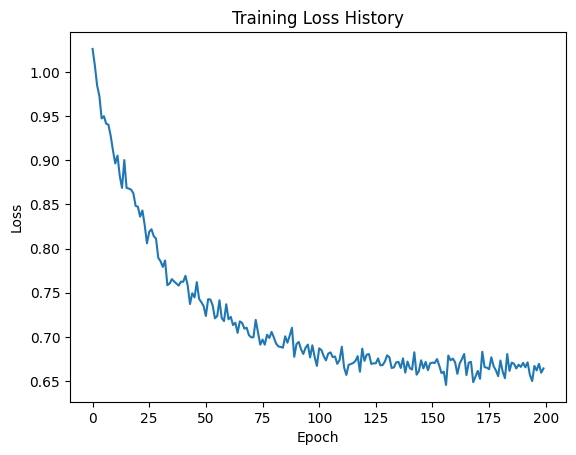

In [46]:
plt.plot(loss_history)
plt.title("Training Loss History")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.show()

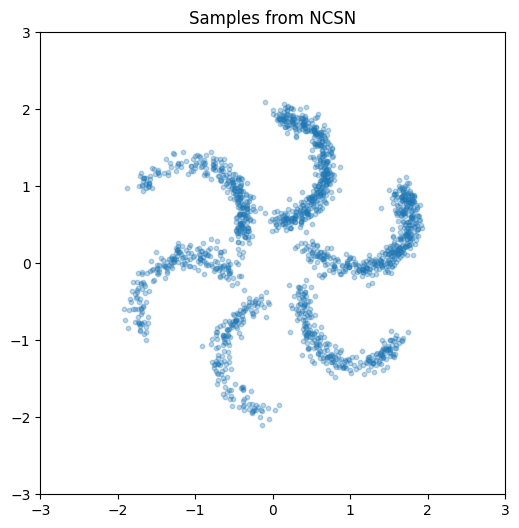

In [47]:
sampler_NCSN = NCSN_sampler(model, scheduler=scheduler, device=device)

X = sampler_NCSN.sample(batch_size=512, num_batches=10, num_steps=2000)
plt.figure(figsize=(6,6))
plt.xlim(-3, 3)
plt.ylim(-3, 3)
plt.scatter(X[:,0], X[:,1], s=10, alpha=0.3)
plt.title("Samples from NCSN")
plt.show()


Generating GIF...
Displaying ncsn_sampling.gif...


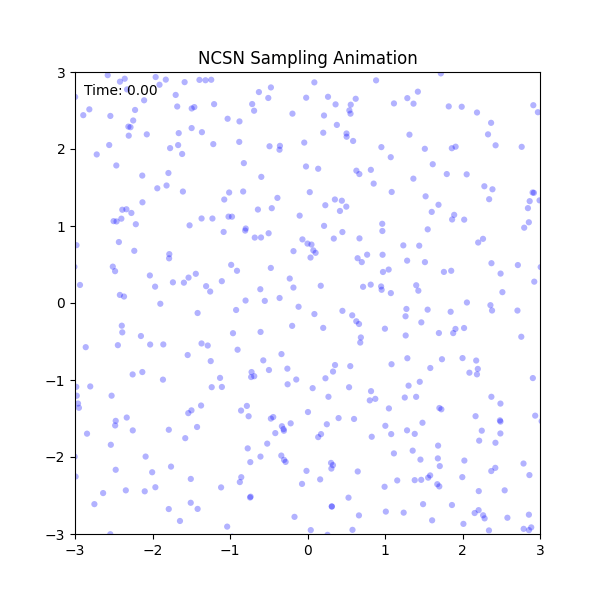

In [48]:
def animate_sampling(sampler, num_steps=2000, delim=50, interval=30, title="NCSN Sampling", color="green", filename='ncsn_sampling.gif', fps=30):
    history = sampler.sample_with_history(batch_size=2048, num_steps=num_steps, delim=delim)

    # Let history forward and backward for smooth looping
    history = np.concatenate([history, history[::-1]], axis=0)
        
    num_frames, _, _ = history.shape
    
    fig, ax = plt.subplots(figsize=(6, 6))
    
    ax.set_xlim(-3, 3)
    ax.set_ylim(-3, 3)
    ax.set_title(title)
    
    scatter = ax.scatter([], [], s=20, alpha=0.3, c=color, edgecolors='none')
    text = ax.text(0.02, 0.95, '', transform=ax.transAxes) 

    def update(frame):
        current_points = history[frame]
        scatter.set_offsets(current_points)
        
        t = frame / (num_frames - 1)
        text.set_text(f"Time: {t:.2f}")
        return scatter, text

    anim = animation.FuncAnimation(
        fig, update, frames=num_frames, interval=interval, blit=True, repeat=True
    )

    print("Generating GIF...")
    anim.save(filename, writer='pillow', fps=fps)
    plt.close() 
    
    print(f"Displaying {filename}...")
    display(Image(filename=filename))
    
    return anim

anim = animate_sampling(sampler_NCSN, interval=50, title="NCSN Sampling Animation", color="blue", filename='ncsn_sampling.gif', fps=30)

### DDPM Sampler

In [49]:
class DDPM_sampler:
    # DDPM style Sampler
    # But for VE-SDE
    def __init__(self, score_model, scheduler=schedule_sigma(), device='cpu'):
        self.score_model = score_model
        self.scheduler = scheduler
        self.device = device
    
    def sample(self, batch_size, num_batches, num_steps=1000):
        self.score_model.eval()
        
        result = np.zeros((num_batches * batch_size, 2), dtype=np.float32)

        with torch.no_grad():
            t_init = torch.zeros(batch_size, device=self.device)
            sigma_max = self.scheduler.get_sigma(t_init).view(-1, 1)
            x = torch.randn(batch_size, 2).to(self.device) * sigma_max
            for i in range(num_batches):
                x = torch.randn(batch_size, 2).to(self.device)
                for step in range(num_steps):
                    t = torch.full((batch_size,), step / num_steps, device=self.device)
                    sigma_curr = self.scheduler.get_sigma(t).view(-1, 1)
                    sigma_next = self.scheduler.get_sigma(torch.clamp(t + 1.0 / num_steps, max=1.0)).view(-1, 1)

                    score = self.score_model(x, sigma_curr)
                    drift = (sigma_curr ** 2 - sigma_next ** 2) * score

                    if step < num_steps - 1:
                        z = torch.randn_like(x)
                        diffusion = torch.sqrt(sigma_curr ** 2 - sigma_next ** 2) * z
                    else:
                        diffusion = 0.0

                    x = x + drift + diffusion
                    
                result[i * batch_size:(i + 1) * batch_size] = x.detach().cpu().numpy()
        return result
    
    def sample_with_history(self, batch_size, num_steps=1000, delim=10):
        self.score_model.eval()
        
        t_init = torch.zeros(batch_size, device=self.device)
        sigma_max = self.scheduler.get_sigma(t_init).view(-1, 1)
        x = torch.randn(batch_size, 2).to(self.device) * sigma_max
        history = [x.detach().cpu().numpy()]

        with torch.no_grad():
            for step in range(num_steps):
                t = torch.full((batch_size,), step / num_steps, device=self.device)
                sigma_curr = self.scheduler.get_sigma(t).view(-1, 1)
                sigma_next = self.scheduler.get_sigma(torch.clamp(t + 1.0 / num_steps, max=1.0)).view(-1, 1)

                score = self.score_model(x, sigma_curr)
                drift = (sigma_curr ** 2 - sigma_next ** 2) * score

                if step < num_steps - 1:
                    z = torch.randn_like(x)
                    diffusion = torch.sqrt(sigma_curr ** 2 - sigma_next ** 2) * z
                else:
                    diffusion = 0.0

                x = x + drift + diffusion

                if step % delim == 0:
                    history.append(x.detach().cpu().numpy())
        return np.array(history)

In [18]:
class schedule_sigma_linear:
    def __init__(self, sigma_min=0.01, sigma_max=1.0):
        self.sigma_min = sigma_min
        self.sigma_max = sigma_max

    def get_sigma(self, t):
        return self.sigma_max - t * (self.sigma_max - self.sigma_min)

In [19]:
class schedule_sigma_karras:
    def __init__(self, sigma_min=0.01, sigma_max=1.0, rho=7.0):
        self.sigma_min = sigma_min
        self.sigma_max = sigma_max
        self.rho = rho

    def get_sigma(self, t):
        return (self.sigma_max ** (1 / self.rho) + t * (self.sigma_min ** (1 / self.rho) - self.sigma_max ** (1 / self.rho))) ** self.rho

In [20]:
class scheduler_sigma_polynomial:
    def __init__(self, sigma_min=0.01, sigma_max=1.0, power=2.0):
        self.sigma_min = sigma_min
        self.sigma_max = sigma_max
        self.power = power

    def get_sigma(self, t):
        return self.sigma_min + (self.sigma_max - self.sigma_min) * (1 - t) ** self.power

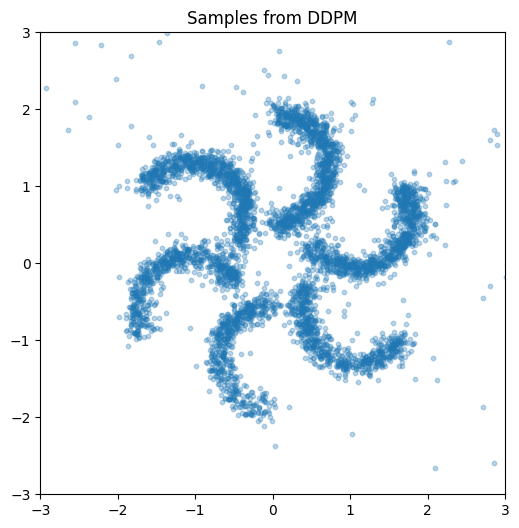

In [50]:
sampler_DDPM = DDPM_sampler(model, scheduler=scheduler, device=device)

X = sampler_DDPM.sample(batch_size=512, num_batches=10, num_steps=200)
plt.figure(figsize=(6,6))
plt.xlim(-3, 3)
plt.ylim(-3, 3)
plt.scatter(X[:,0], X[:,1], s=10, alpha=0.3)
plt.title("Samples from DDPM")
plt.show()

Generating GIF...
Displaying ddpm_sampling.gif...


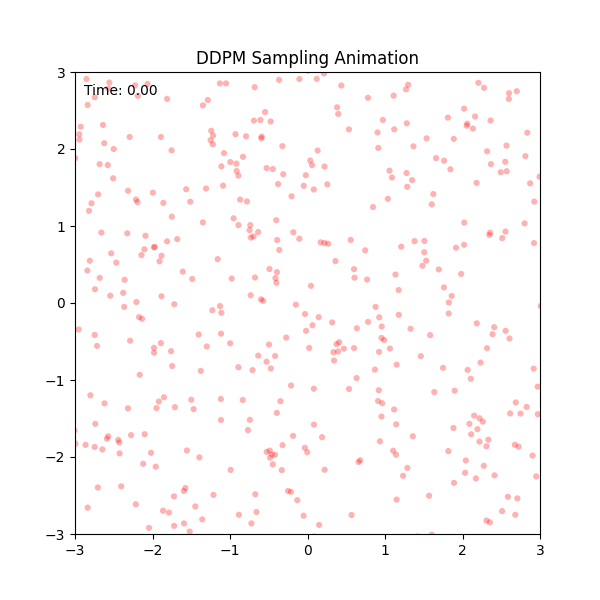

In [51]:
anim = animate_sampling(sampler_DDPM, num_steps=1000, delim=20, interval=30, title="DDPM Sampling Animation", color="red", filename='ddpm_sampling.gif', fps=30)

### DDIM Sampler

In [23]:
class DDIM_sampler:
    # DDIM Style Sampler
    def __init__(self, score_model, scheduler=schedule_sigma(), eta=0.0,device='cpu'):
        self.score_model = score_model
        self.scheduler = scheduler
        self.device = device
        self.eta = eta
    
    def sample(self, batch_size, num_batches, num_steps=1000):
        self.score_model.eval()
        
        result = np.zeros((num_batches * batch_size, 2), dtype=np.float32)

        t_init = torch.zeros(batch_size, device=self.device)
        sigma_max = self.scheduler.get_sigma(t_init).view(-1, 1)
        
        with torch.no_grad():
            for i in range(num_batches):
                x = torch.randn(batch_size, 2).to(self.device) * sigma_max
                for step in range(num_steps):
                    t = torch.full((batch_size,), step / num_steps, device=self.device)
                    sigma_curr = self.scheduler.get_sigma(t).view(-1, 1)
                    sigma_next = self.scheduler.get_sigma(torch.clamp(t + 1.0 / num_steps, min=0.0)).view(-1, 1)

                    score = self.score_model(x, sigma_curr)
                    pred_noise = -sigma_curr * score
                    x0_pred = x - sigma_curr * pred_noise

                    sigma_rand = self.eta * torch.sqrt(sigma_curr ** 2 - sigma_next ** 2)
                    sigma_det = torch.sqrt(torch.clamp(sigma_next**2 - sigma_rand**2, min=0.0))

                    dir_vector = sigma_det * pred_noise

                    if self.eta > 0:
                        z = torch.randn_like(x) if step < num_steps - 1 else 0.0
                        diffusion = sigma_rand * z
                    else:
                        diffusion = 0.0

                    x = x0_pred + dir_vector + diffusion
                    
                result[i * batch_size:(i + 1) * batch_size] = x.detach().cpu().numpy()
        return result
    
    def sample_with_history(self, batch_size, num_steps=1000, delim=10):
        self.score_model.eval()
        
        t_init = torch.zeros(batch_size, device=self.device)
        sigma_max = self.scheduler.get_sigma(t_init).view(-1, 1)
        x = torch.randn(batch_size, 2).to(self.device) * sigma_max
        history = [x.detach().cpu().numpy()]

        with torch.no_grad():
            for step in range(num_steps):
                t = torch.full((batch_size,), step / num_steps, device=self.device)
                sigma_curr = self.scheduler.get_sigma(t).view(-1, 1)
                sigma_next = self.scheduler.get_sigma(torch.clamp(t + 1.0 / num_steps, min=0.0)).view(-1, 1)

                score = self.score_model(x, sigma_curr)
                pred_noise = -sigma_curr * score
                x0_pred = x - sigma_curr * pred_noise

                sigma_rand = self.eta * torch.sqrt(sigma_curr ** 2 - sigma_next ** 2)
                sigma_det = torch.sqrt(torch.clamp(sigma_next**2 - sigma_rand**2, min=0.0))

                dir_vector = sigma_det * pred_noise

                if self.eta > 0:
                    z = torch.randn_like(x) if step < num_steps - 1 else 0.0
                    diffusion = sigma_rand * z
                else:
                    diffusion = 0.0

                x = x0_pred + dir_vector + diffusion

                if step % delim == 0:
                    history.append(x.detach().cpu().numpy())
        return np.array(history)

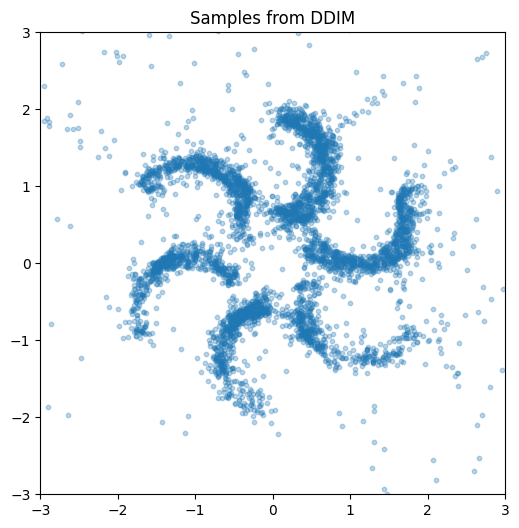

In [54]:
sampler_DDIM = DDIM_sampler(model, scheduler=scheduler, eta=0.1, device=device)

X = sampler_DDIM.sample(batch_size=512, num_batches=10, num_steps=50)
plt.figure(figsize=(6,6))
plt.xlim(-3, 3)
plt.ylim(-3, 3)
plt.scatter(X[:,0], X[:,1], s=10, alpha=0.3)
plt.title("Samples from DDIM")
plt.show()

Generating GIF...
Displaying ddim_sampling.gif...


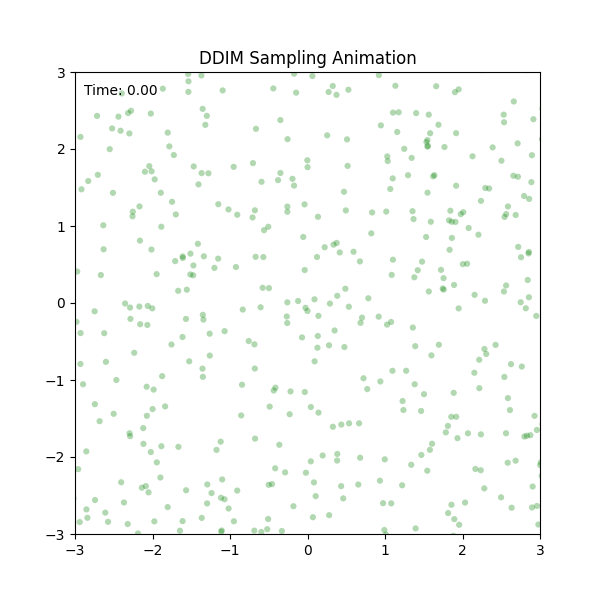

In [55]:
anim = animate_sampling(sampler_DDIM, num_steps=100, delim=2, interval=50, title="DDIM Sampling Animation", color="green", filename='ddim_sampling.gif', fps=30)

## Guidance

### Classifier Guidance

In [147]:
class Classifier(nn.Module):
    def __init__(self, input_dim=2, hidden_dim=128, num_classes=6):
        super(Classifier, self).__init__()

        self.x_fc = nn.Linear(input_dim, hidden_dim)
        self.sigma_fc = nn.Linear(1, hidden_dim)
        self.fc = nn.Linear(hidden_dim, num_classes)

    def forward(self, x, sigma):
        x = F.relu(self.x_fc(x))
        sigma = F.relu(self.sigma_fc(torch.log(sigma).view(-1, 1)))
        x_embed = x + sigma

        out = self.fc(x_embed)
        return out

In [71]:
def train_classifier(model, optimizer, scheduler, num_epochs=100):
    model.train()
    train_losses = []
    test_losses = []
    accuracies = []
    for epoch in range(num_epochs):
        epoch_loss = 0.0
        for batch_x, batch_y in trainloader:
            batch_x = batch_x.to(device)
            batch_y = batch_y.to(device)
            batch_size = batch_x.size(0)

            t = torch.rand(batch_size, device=device)

            sigma = scheduler.get_sigma(t).view(-1, 1)

            logits = model(batch_x, sigma)

            loss = F.cross_entropy(logits, batch_y)
            
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()
            epoch_loss += loss.item() * batch_size
        epoch_loss /= len(trainset)
        train_losses.append(epoch_loss)

        accuracy = 0.0
        for batch_x, batch_y in testloader:
            batch_x = batch_x.to(device)
            batch_y = batch_y.to(device)
            batch_size = batch_x.size(0)

            t = torch.rand(batch_size, device=device)

            sigma = scheduler.get_sigma(t).view(-1, 1)

            logits = model(batch_x, sigma)

            loss = F.cross_entropy(logits, batch_y)
            
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()
            epoch_loss += loss.item() * batch_size

            accuracy += (logits.argmax(dim=1) == batch_y).float().sum().item()
        epoch_loss /= len(testset)
        accuracies.append(accuracy / len(testset))
        test_losses.append(epoch_loss)
        if (epoch + 1) % 10 == 0:
            print(f"Epoch [{epoch+1}/{num_epochs}], Train Loss: {train_losses[-1]:.4f}, Test Loss: {test_losses[-1]:.4f}, Accuracy: {accuracies[-1]:.4f}")

In [148]:
classifier = Classifier().to(device)
optimizer_cls = optim.Adam(classifier.parameters(), lr=1e-3)
train_classifier(classifier, optimizer_cls, scheduler, num_epochs=100)

Epoch [10/100], Train Loss: 0.0116, Test Loss: 0.0096, Accuracy: 1.0000
Epoch [20/100], Train Loss: 0.0029, Test Loss: 0.0024, Accuracy: 1.0000
Epoch [30/100], Train Loss: 0.0011, Test Loss: 0.0008, Accuracy: 1.0000
Epoch [40/100], Train Loss: 0.0005, Test Loss: 0.0004, Accuracy: 1.0000
Epoch [50/100], Train Loss: 0.0002, Test Loss: 0.0002, Accuracy: 1.0000
Epoch [60/100], Train Loss: 0.0001, Test Loss: 0.0001, Accuracy: 1.0000
Epoch [70/100], Train Loss: 0.0000, Test Loss: 0.0000, Accuracy: 1.0000
Epoch [80/100], Train Loss: 0.0000, Test Loss: 0.0000, Accuracy: 1.0000
Epoch [90/100], Train Loss: 0.0000, Test Loss: 0.0000, Accuracy: 1.0000
Epoch [100/100], Train Loss: 0.0000, Test Loss: 0.0000, Accuracy: 1.0000


In [156]:
class Guided_score(nn.Module):
    def __init__(self, score_model, classifier, guidance_scale=1.0, guidance_index=0):
        super(Guided_score, self).__init__()
        self.score_model = score_model
        self.classifier = classifier
        self.guidance_scale = guidance_scale
        self.guidance_index = guidance_index
    
    def set_guidance_scale(self, scale):
        self.guidance_scale = scale
    
    def set_guidance_index(self, index):
        self.guidance_index = index

    def forward(self, x, sigma):
        score = self.score_model(x, sigma)

        with torch.enable_grad():
            x.requires_grad_(True)
            logits = self.classifier(x, sigma)
            log_probs = F.log_softmax(logits, dim=1)
            selected_log_probs = log_probs[:, self.guidance_index]
            classifier_loss = selected_log_probs.sum()
            grads = torch.autograd.grad(classifier_loss, x)[0]
        grads = grads.detach() / (torch.norm(grads, dim=-1, keepdim=True) + 1e-8)
        guided_score = score + self.guidance_scale * grads
        return guided_score

In [157]:
model_guided = Guided_score(model, classifier, guidance_scale=0.0, guidance_index=0).to(device)

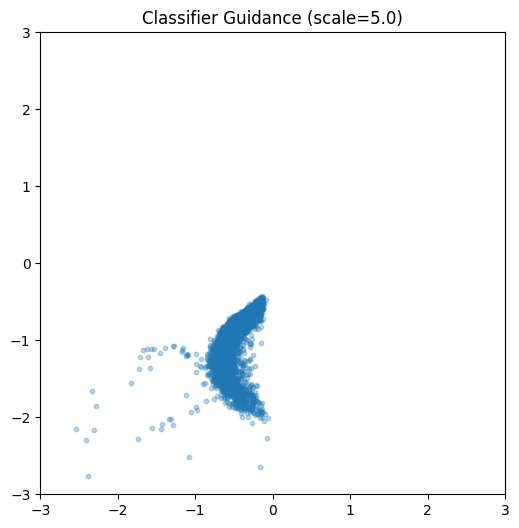

In [174]:
sampler_cls = DDIM_sampler(model_guided, eta=0.3, scheduler=scheduler, device=device)

sampler_cls.score_model.set_guidance_scale(5.0)
sampler_cls.score_model.set_guidance_index(3)
X = sampler_cls.sample(batch_size=512, num_batches=10, num_steps=200)
plt.figure(figsize=(6,6))
plt.xlim(-3, 3)
plt.ylim(-3, 3)
plt.scatter(X[:,0], X[:,1], s=10, alpha=0.3)
plt.title(f"Classifier Guidance (scale={sampler_cls.score_model.guidance_scale})")
plt.show()

Generating GIF...
Displaying cls_sampling.gif...


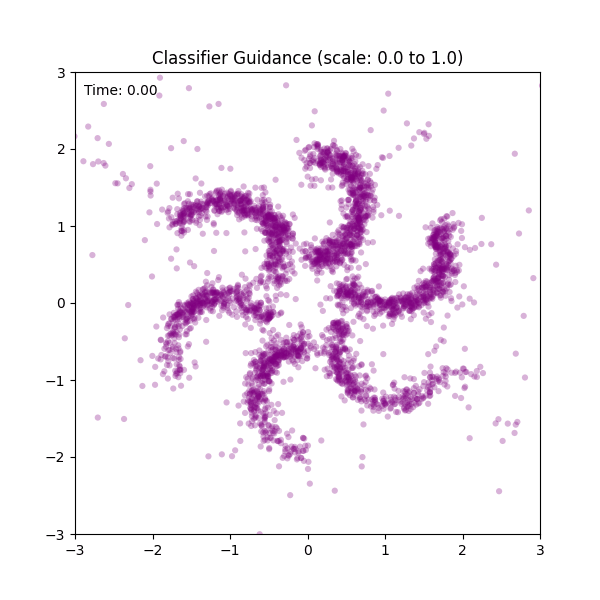

In [177]:
def animate_guidance(sampler, min_scale=0.0, max_scale=5.0, frames=50, num_steps=200, interval=30, title="Classifier Guidance", color="cyan", filename='cls_sampling.gif', fps=30):
    prev_scale = sampler.score_model.guidance_scale
    scales = np.linspace(min_scale, max_scale, frames)
    history = []
    for scale in scales:
        sampler.score_model.set_guidance_scale(scale)
        X = sampler.sample(batch_size=2048, num_batches=2, num_steps=num_steps)
        history.append(X)
    
    history = np.concatenate([history, history[::-1]], axis=0)

    num_frames, _, _ = history.shape
    
    fig, ax = plt.subplots(figsize=(6, 6))
    
    ax.set_xlim(-3, 3)
    ax.set_ylim(-3, 3)
    ax.set_title(title + f" (scale: {min_scale} to {max_scale})")
    
    scatter = ax.scatter([], [], s=20, alpha=0.3, c=color, edgecolors='none')
    text = ax.text(0.02, 0.95, '', transform=ax.transAxes) 

    def update(frame):
        current_points = history[frame]
        scatter.set_offsets(current_points)
        
        t = frame / (num_frames - 1)
        text.set_text(f"Time: {t:.2f}")
        return scatter, text

    anim = animation.FuncAnimation(
        fig, update, frames=num_frames, interval=interval, blit=True, repeat=True
    )

    print("Generating GIF...")
    anim.save(filename, writer='pillow', fps=fps)
    plt.close() 
    
    print(f"Displaying {filename}...")
    display(Image(filename=filename))

    sampler.score_model.set_guidance_scale(prev_scale)
    
    return anim
anim = animate_guidance(sampler_cls, min_scale=0.0, max_scale=1.0, frames=20, num_steps=200, interval=50, title="Classifier Guidance", color="purple", filename='cls_sampling.gif', fps=30)